c:\Users\rebec\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\rebec\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to C:\Users\rebec/.cache\torch\hub\checkpoints\vgg16-397923af.pth
100%|██████████| 528M/528M [00:23<00:00, 23.8MB/s] 
Epoch 1/5 [Val]: 100%|██████████| 8/8 [00:37<00:00,  4.72s/it]


Epoch 1/5 - Train Loss: 401.5437, Train Acc: 57.90% - Val Loss: 4.0834, Val Acc: 86.80%


Epoch 2/5 [Val]: 100%|██████████| 8/8 [00:37<00:00,  4.64s/it]


Epoch 2/5 - Train Loss: 304.5537, Train Acc: 77.36% - Val Loss: 5.7042, Val Acc: 86.40%


Epoch 3/5 [Val]: 100%|██████████| 8/8 [00:22<00:00,  2.82s/it]


Epoch 3/5 - Train Loss: 315.8195, Train Acc: 80.80% - Val Loss: 4.9488, Val Acc: 92.80%


Epoch 4/5 [Val]: 100%|██████████| 8/8 [00:38<00:00,  4.86s/it]


Epoch 4/5 - Train Loss: 395.7173, Train Acc: 83.15% - Val Loss: 9.6271, Val Acc: 89.20%


Epoch 5/5 [Val]: 100%|██████████| 8/8 [00:25<00:00,  3.15s/it]


Epoch 5/5 - Train Loss: 441.6379, Train Acc: 84.32% - Val Loss: 10.5264, Val Acc: 92.00%


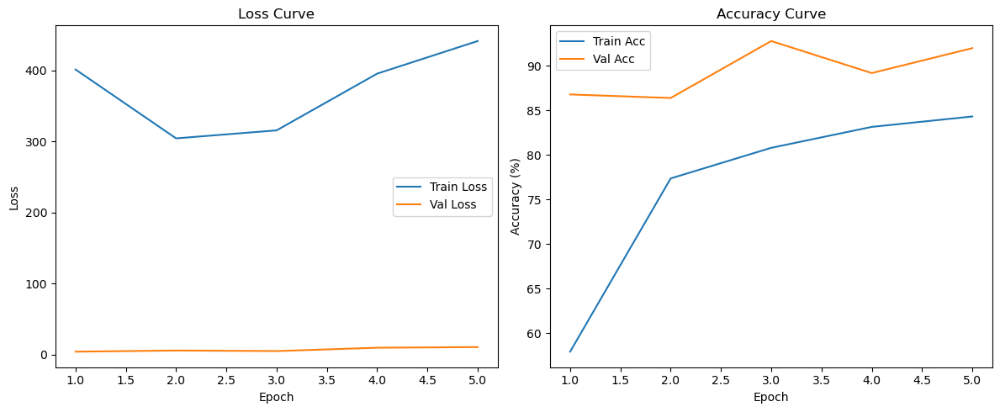


✅ Test Accuracy (VGG16 + Partial FT + Reg): 94.40%

📊 Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      0.80      0.89         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       1.00      0.80      0.89         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      1.00      1.00         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      1.00      1.00         5
               COMET MOTH       1.00      0.80      0.89         5
    DEATHS HEAD HAWK MOTH       0.83      1.00      0.91         5
       ELEPHANT HAWK MOTH       0.83      1.00    

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
from pathlib import Path

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Paths 
dataset_path = Path("../data/kaggle-dataset/archive")
train_path = dataset_path / "train"
val_path = dataset_path / "valid"
test_path = dataset_path / "test"

# Transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Datasets and loaders
train_dataset = datasets.ImageFolder(train_path, transform=transform)
val_dataset = datasets.ImageFolder(val_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

num_classes = len(train_dataset.classes)
class_names = train_dataset.classes

# Load pretrained VGG16
model = models.vgg16(pretrained=True)

# Partial fine-tuning: unfreeze classifier only
for name, param in model.named_parameters():
    if "classifier" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

# Modify classifier
model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001, weight_decay=1e-4)

# Track history
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

# Training loop
epochs = 5
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]"):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_acc = 100 * correct / total
    train_loss = running_loss
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    # Validation
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()

    val_acc = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    print(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}% "
          f"- Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

# Plot Loss and Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, epochs + 1), train_losses, label="Train Loss")
plt.plot(range(1, epochs + 1), val_losses, label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(1, epochs + 1), train_accuracies, label="Train Acc")
plt.plot(range(1, epochs + 1), val_accuracies, label="Val Acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Accuracy Curve")
plt.legend()
plt.tight_layout()
plt.show()

# Evaluate on Test Set
model.eval()
all_preds = []
all_labels = []
test_correct = 0
test_total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = outputs.max(1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        test_total += labels.size(0)
        test_correct += predicted.eq(labels).sum().item()

# ✅ Print Test Accuracy
test_acc = 100 * test_correct / test_total
print(f"\n✅ Test Accuracy (VGG16 + Partial FT + Reg): {test_acc:.2f}%")

# Classification report
print("\n📊 Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Show confused pairs only
cm_no_diag = cm.copy()
np.fill_diagonal(cm_no_diag, 0)
confused_indices = np.argwhere(cm_no_diag > 0)

print("\n🔍 Confused Class Pairs:")
for i, (true_idx, pred_idx) in enumerate(confused_indices):
    count = cm[true_idx][pred_idx]
    print(f"{i+1}. True: {class_names[true_idx]}  ↔  Predicted: {class_names[pred_idx]}  ({count} times)")



🔍 Confusion: True Label = 'ARCIGERA FLOWER MOTH' ↔ Predicted as = 'HERCULES MOTH'


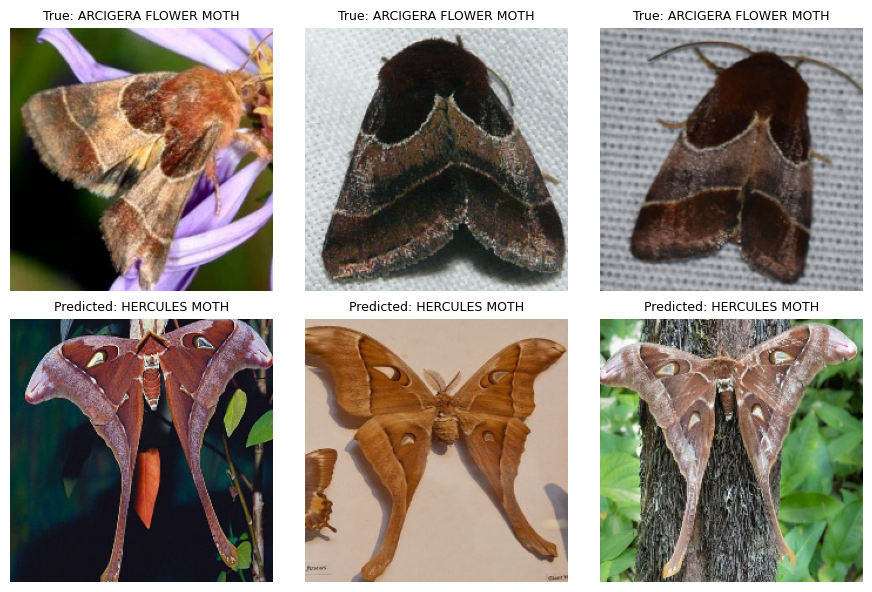


🔍 Confusion: True Label = 'BANDED TIGER MOTH' ↔ Predicted as = 'ROSY UNDERWING MOTH'


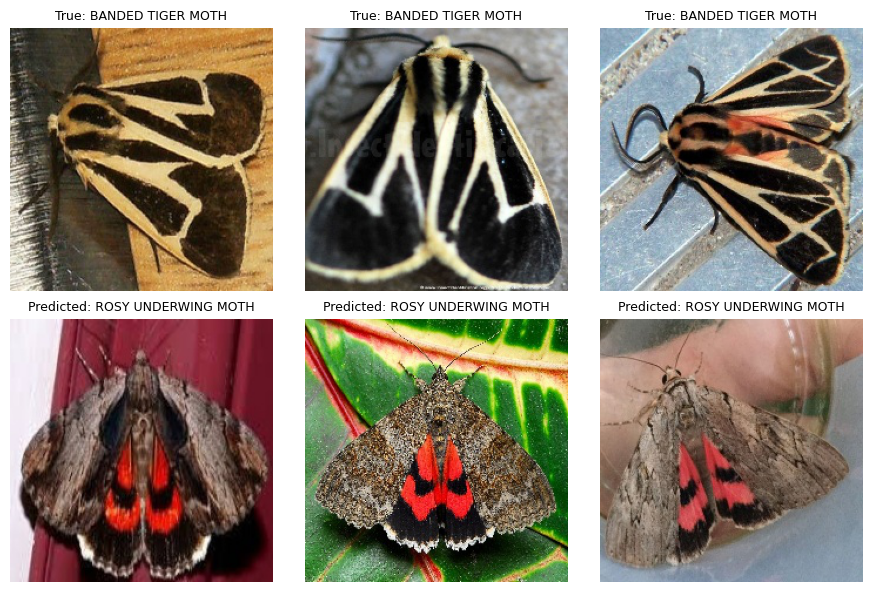


🔍 Confusion: True Label = 'COMET MOTH' ↔ Predicted as = 'LUNA MOTH'


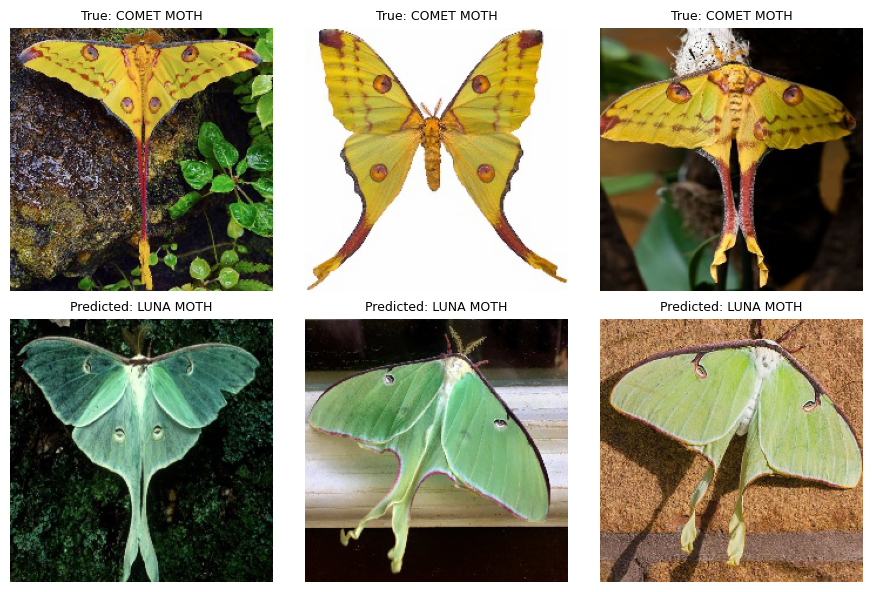


🔍 Confusion: True Label = 'EYED HAWK MOTH' ↔ Predicted as = 'JULY BELLE MOTH'


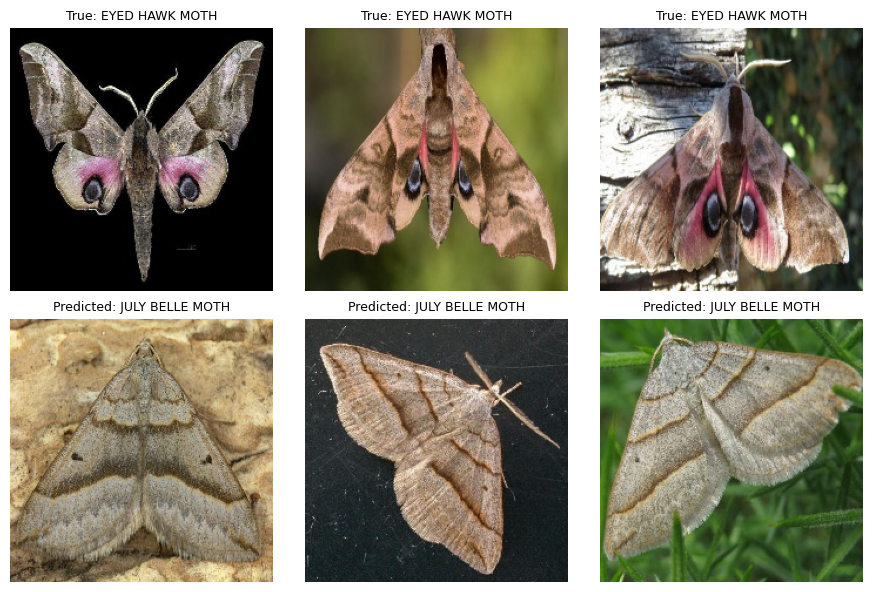


🔍 Confusion: True Label = 'EYED HAWK MOTH' ↔ Predicted as = 'OLEANDER HAWK MOTH'


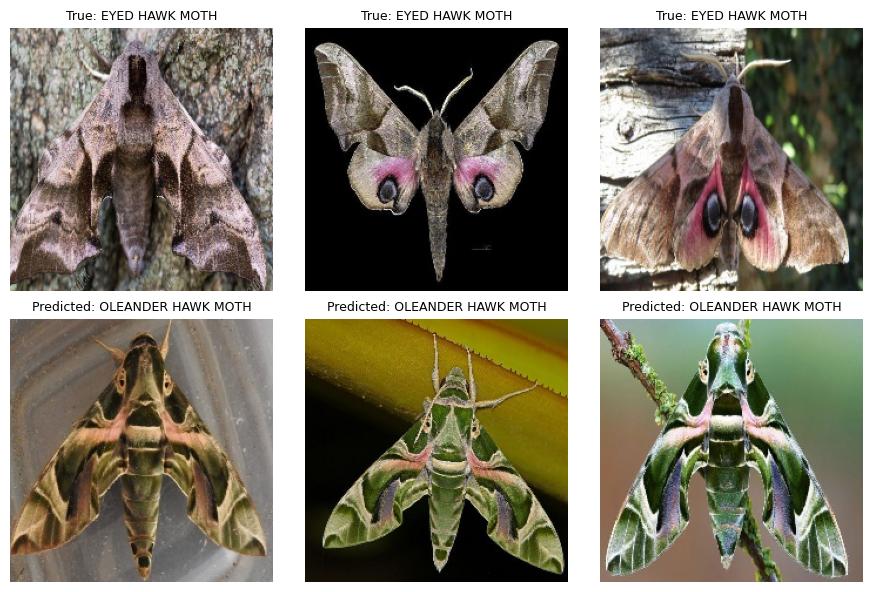


🔍 Confusion: True Label = 'HUMMING BIRD HAWK MOTH' ↔ Predicted as = 'DEATHS HEAD HAWK MOTH'


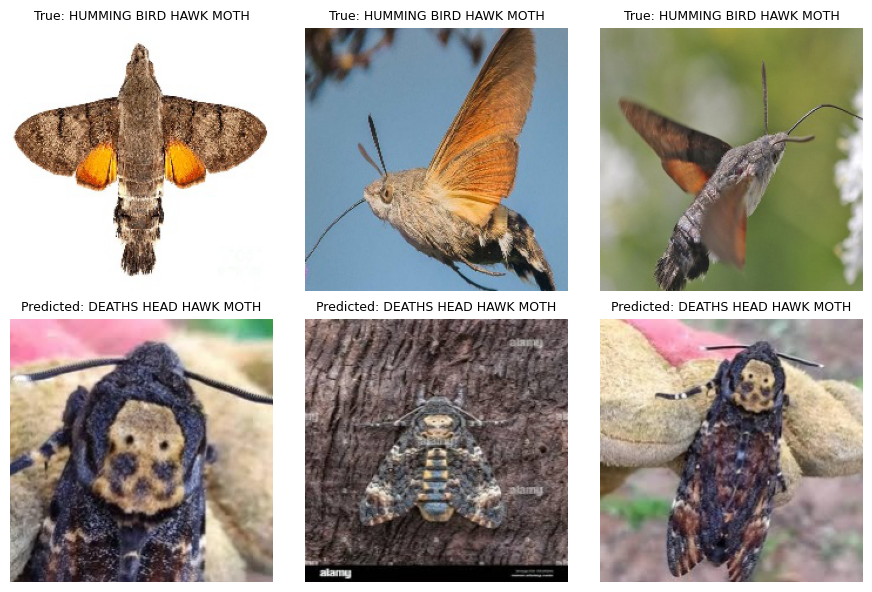


🔍 Confusion: True Label = 'MUSLIN MOTH' ↔ Predicted as = 'HERCULES MOTH'


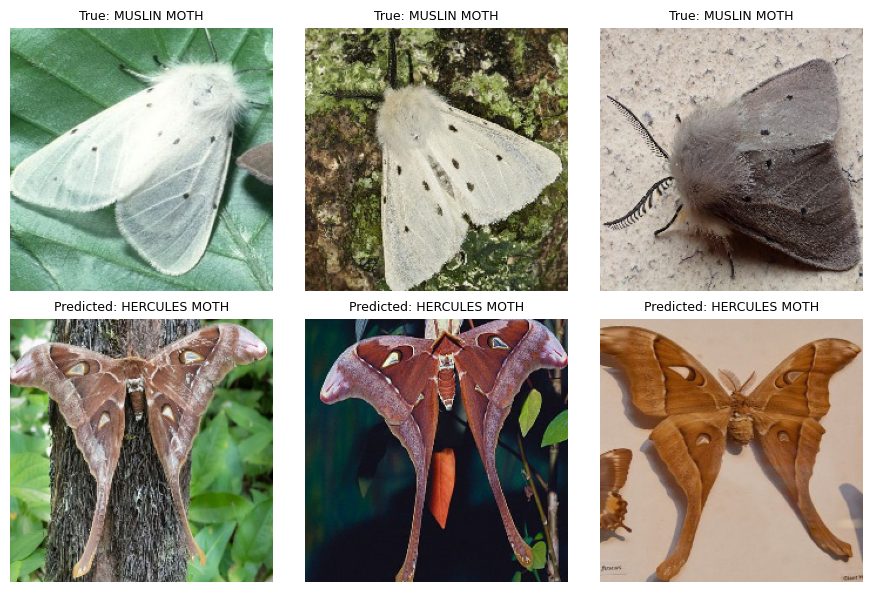


🔍 Confusion: True Label = 'POLYPHEMUS MOTH' ↔ Predicted as = 'EMPEROR GUM MOTH'


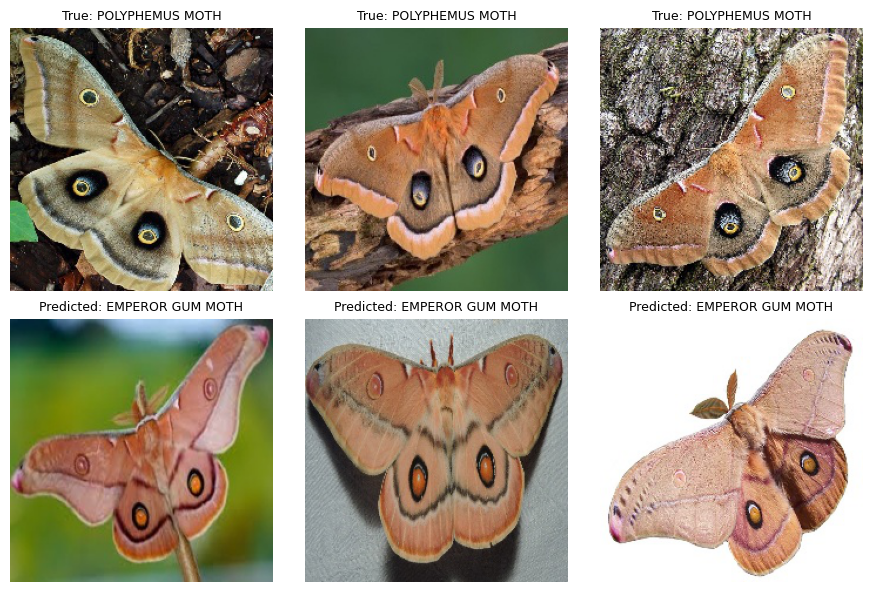


🔍 Confusion: True Label = 'ROSY MAPLE MOTH' ↔ Predicted as = 'ELEPHANT HAWK MOTH'


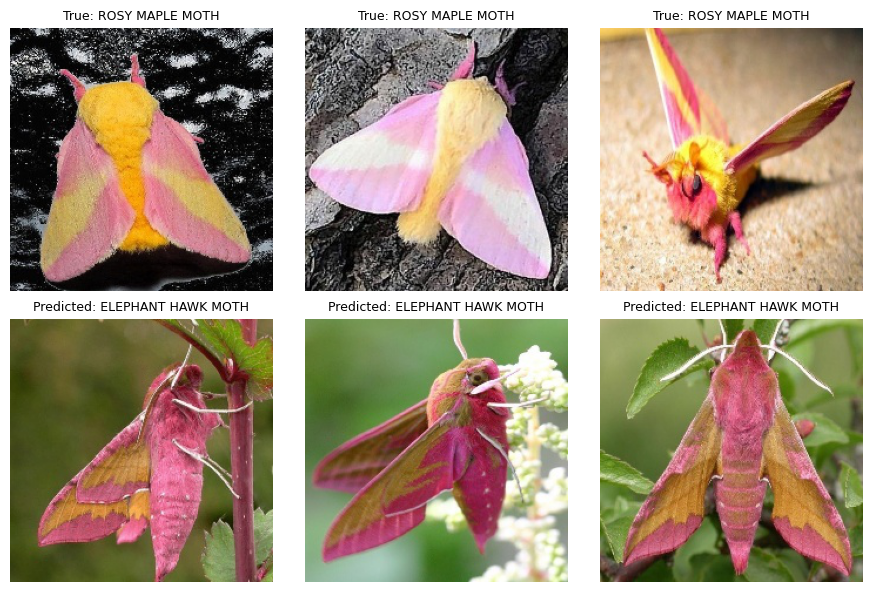


🔍 Confusion: True Label = 'RUSTY DOT PEARL MOTH' ↔ Predicted as = 'HERCULES MOTH'


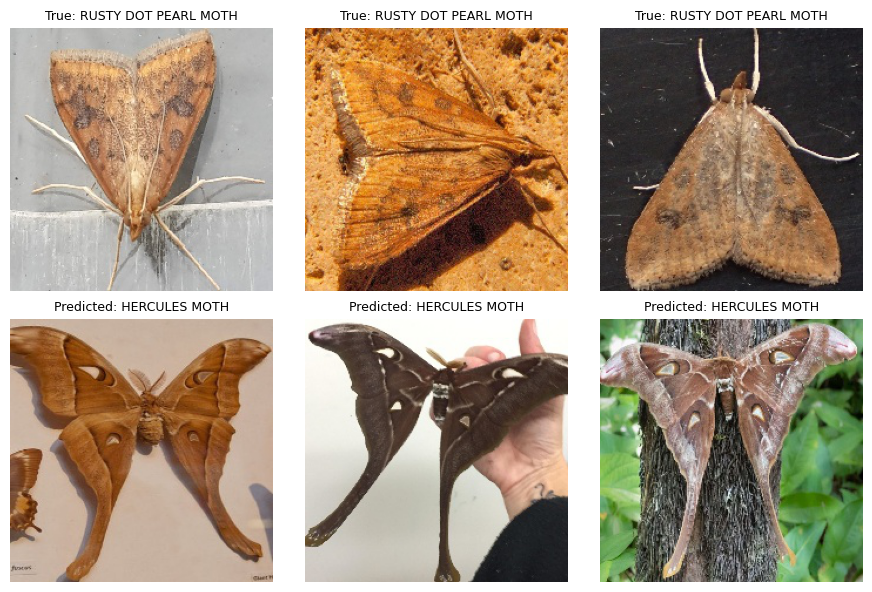


🔍 Confusion: True Label = 'SCHORCHED WING MOTH' ↔ Predicted as = 'HERCULES MOTH'


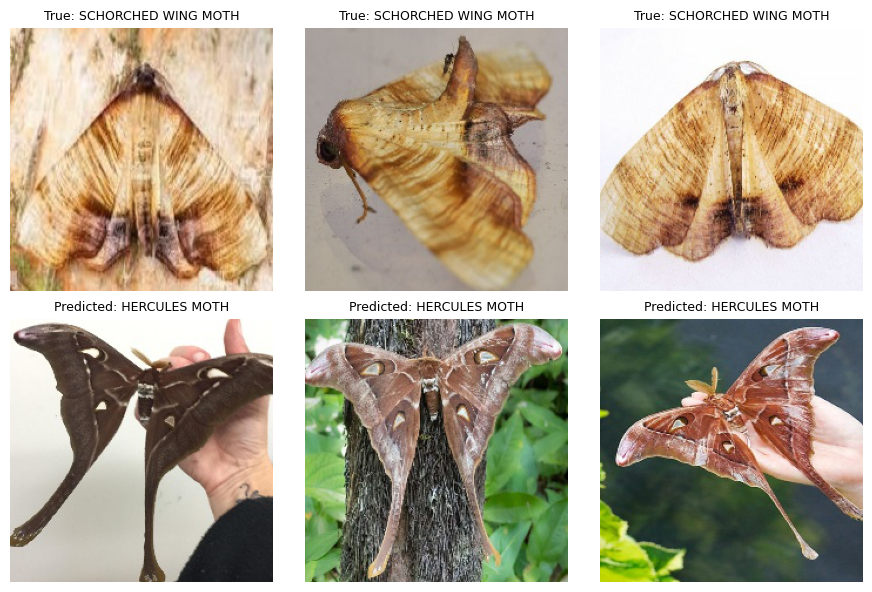


🔍 Confusion: True Label = 'SUSSEX EMERALD MOTH' ↔ Predicted as = 'LUNA MOTH'


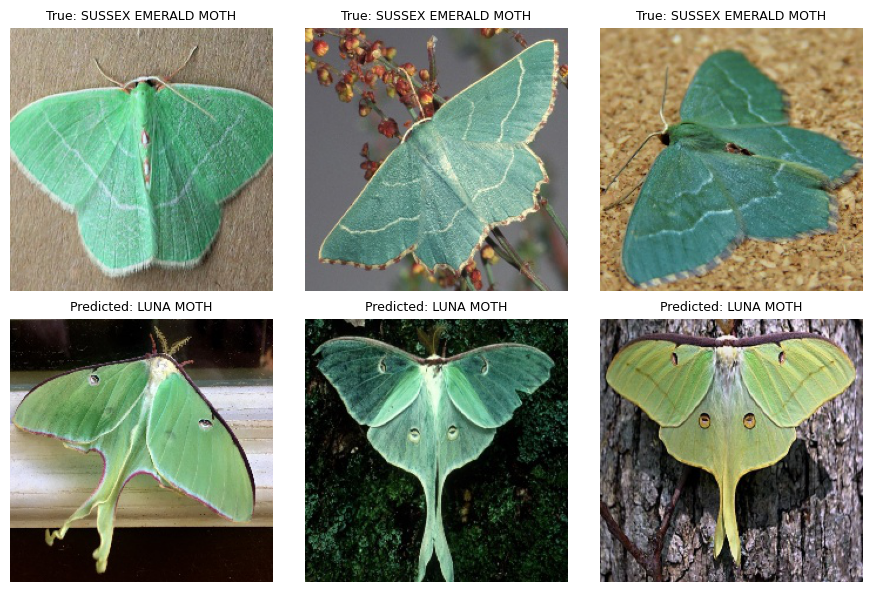


🔍 Confusion: True Label = 'VESTAL MOTH' ↔ Predicted as = 'PALPITA VITREALIS MOTH'


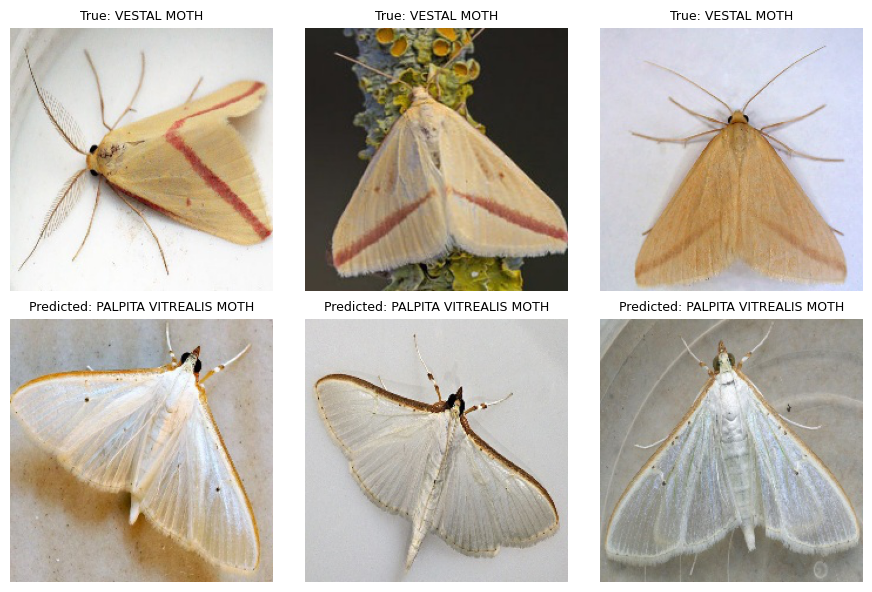

In [3]:
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import random

def show_confused_pairs(dataset_path, confused_pairs, samples_per_class=3):
    """
    Visualize sample images of confused species pairs side by side.

    Parameters:
        dataset_path (Path or str): Root path to dataset containing 'test' folder.
        confused_pairs (list of tuples): List of (true_species, predicted_species).
        samples_per_class (int): Number of images to show per species.
    """
    test_path = Path(dataset_path) / "test"

    for true_species, pred_species in confused_pairs:
        true_dir = test_path / true_species
        pred_dir = test_path / pred_species

        true_images = list(true_dir.glob("*"))
        pred_images = list(pred_dir.glob("*"))

        # Pick random sample images or fewer if not enough
        true_samples = random.sample(true_images, min(samples_per_class, len(true_images)))
        pred_samples = random.sample(pred_images, min(samples_per_class, len(pred_images)))

        print(f"\n🔍 Confusion: True Label = '{true_species}' ↔ Predicted as = '{pred_species}'")

        fig, axes = plt.subplots(2, samples_per_class, figsize=(samples_per_class * 3, 6))

        for i in range(samples_per_class):
            # True species images on first row
            if i < len(true_samples):
                img = Image.open(true_samples[i])
                axes[0, i].imshow(img)
                axes[0, i].set_title(f"True: {true_species}", fontsize=9)
            axes[0, i].axis('off')

            # Predicted species images on second row
            if i < len(pred_samples):
                img = Image.open(pred_samples[i])
                axes[1, i].imshow(img)
                axes[1, i].set_title(f"Predicted: {pred_species}", fontsize=9)
            axes[1, i].axis('off')

        plt.tight_layout()
        plt.show()

# 🔁 InceptionV3 confused pairs
confused_pairs_inception = [
    ("ARCIGERA FLOWER MOTH", "HERCULES MOTH"),
    ("BANDED TIGER MOTH", "ROSY UNDERWING MOTH"),
    ("COMET MOTH", "LUNA MOTH"),
    ("EYED HAWK MOTH", "JULY BELLE MOTH"),
    ("EYED HAWK MOTH", "OLEANDER HAWK MOTH"),
    ("HUMMING BIRD HAWK MOTH", "DEATHS HEAD HAWK MOTH"),
    ("MUSLIN MOTH", "HERCULES MOTH"),
    ("POLYPHEMUS MOTH", "EMPEROR GUM MOTH"),
    ("ROSY MAPLE MOTH", "ELEPHANT HAWK MOTH"),
    ("RUSTY DOT PEARL MOTH", "HERCULES MOTH"),
    ("SCHORCHED WING MOTH", "HERCULES MOTH"),
    ("SUSSEX EMERALD MOTH", "LUNA MOTH"),
    ("VESTAL MOTH", "PALPITA VITREALIS MOTH")
]

dataset_path = Path("../data/kaggle-dataset/archive")

# 👀 Run visualisation for InceptionV3 confused pairs
show_confused_pairs(dataset_path, confused_pairs_inception)
